# Pipeline to obtain Analyses on DMN dynamics in TVB-AdEx

In [1]:
%%capture --no-display
!pip install --upgrade tvb-library
!pip install --upgrade tvb-data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import tvb_model_reference.src.nuu_tools_simulation_human as tools

from tvb_model_reference.simulation_file.parameter.parameter_M_Berlin import Parameter
from tvb_model_reference.view.plot_human import multiview_one, prepare_surface_regions_human
from JUSUFlike.Project.Codes.analyses import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
import itertools
import scipy.stats as stats

parameters = Parameter()

/home/master/anaconda3/envs/tvbadexgraph/lib/python3.10/site-packages/tvb/datatypes/surfaces.py:63: UserWarning: Geodesic distance module is unavailable; some functionality for surfaces will be unavailable.
  warnings.warn(msg)


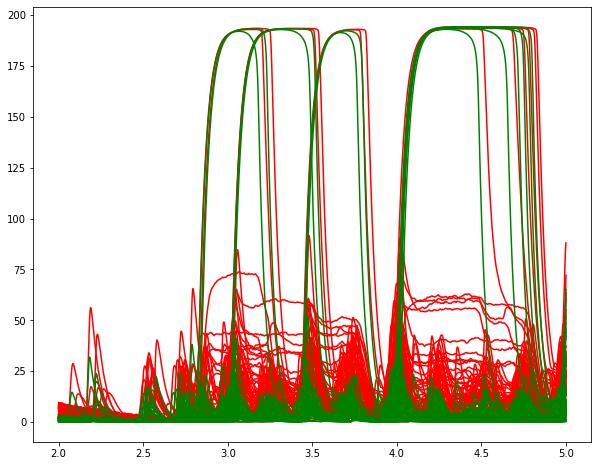

In [2]:
# Select a folder_root
SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
folder_root = '/media/master/Nuevo vol/Internship/Data/hpc_tvbadex/results_jusuf/' # Hard disk in ubuntu
# Define the parameters that we will use
cut_transient = 2000.0
run_sim = 5000.0

S = 0.5
b_e = 120.0
E_L_e = -60.0
E_L_i = -80.0
T = 40.0

fig, ax = plt.subplots(1, 1, figsize=(5, 3))

label_sim = '_a_' + str(S) + '_b_' + str(b_e) + '_ELI_' + str(E_L_i) + \
            '_ELE_' + str(E_L_e) + '_T_' + str(T) + '/'

file_name = folder_root + label_sim

# Draw plots of the firing rates
result = tools.get_result(file_name,cut_transient,run_sim)
time_s = result[0][0]*1e-3 #from ms to sec
FR_exc = result[0][1][:,0,:]*1e3 # from KHz to Hz; Excitatory firing rate
FR_inh = result[0][1][:,1,:]*1e3 # from KHz to Hz; Inhibitory firing rate
time_s = np.array(time_s, dtype=float)
del result

ax.plot(time_s, FR_inh, c='r')
ax.plot(time_s, FR_exc, label=r'$v_e$', c='g')
ax.plot([],[], label=r'$\nu_i$', c='r')
ax.plot([],[], label=r'$nu_e$', c='g')
title = '$S$ = 0.5, $E_{L,i}$ = -80 mV, $E_{L,i}$ = -60 mV, \n $b_e$ = 120 pA, $T$ = 40 ms'
ax.set(xlabel='Time (s)', ylabel='Firing Rate (Hz)', xlim=(3, 5), title=title)

plt.show()

# Select a label for the simulation being analyzed where the resulting figures will be saved

In [4]:
sim_name = label_sim[:-1]

folder_figs = './figures/DMN_studies/' + sim_name + '/'

try:
    os.listdir(folder_figs)
except:
    os.mkdir(folder_figs)

In [5]:
# Prepare the elements that we will need to find the interesting nodes
cortex, conn, hem_left, hem_right = prepare_surface_regions_human(parameters, 
                                                                  conn_filename='Connectivity.zip',
                                                                  zip_filename='Surface_Cortex.zip',
                                                                  region_map_filename='RegionMapping.txt')
the_data = np.zeros((cortex.region_mapping_data.array_data.shape[0],))

# DMN nodes that we will use for the analyses

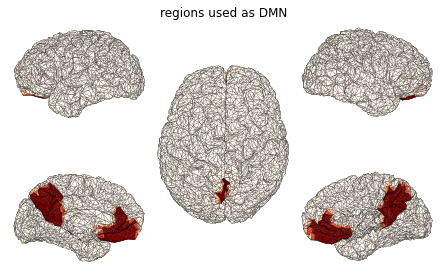

In [6]:
DMN_regions = [28, 29, 52, 53,  # mPFC
          50, 51, 20, 21]   # precuneus and posterior cingulate (seems large)

title = 'regions used as DMN'  # We are clearly missing the angular gyri
multiview_one(cortex, hem_left, hem_right, 
              DMN_regions, the_data, plt.figure(), suptitle='', 
              title=title, figsize=(8, 8), shaded=False)
fig.savefig(folder_figs + sim_name + 'DMN_regions.png')

# Obtaining the pearson correlation coefficient between nodes taking into account the DMN

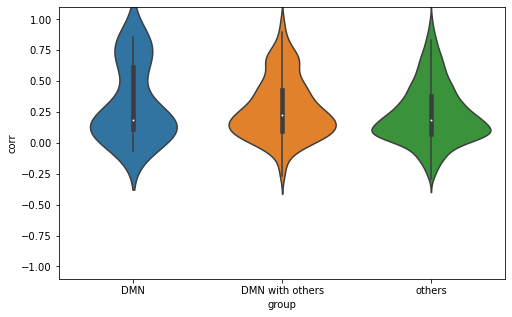

In [7]:
fig, ax = plot_corr_dmn(corr_dmn(FR_exc), type_plot='violin', jitter=False)
fig.savefig(folder_figs + sim_name + 'corr_DMN_others.png')
plt.show()

# Obtaining the FR histogram for nodes in and out the DMN

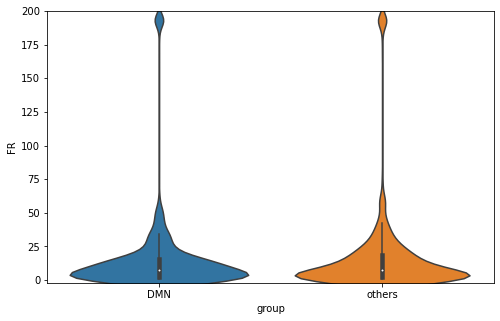

In [8]:
hist_DMN, hist_others, bins_edges = hist_FR_dmn(FR_inh)
# bw can be adjusted to smooth the problems edges of the histogram.
fig, ax = plot_violin_hist_FR(hist_DMN, hist_others, bins_edges, jitter=False, bw_violin=0.15)
fig.savefig(folder_figs + sim_name + 'histFR_DMN_others.png')

# Plot the mean FR in time for each region

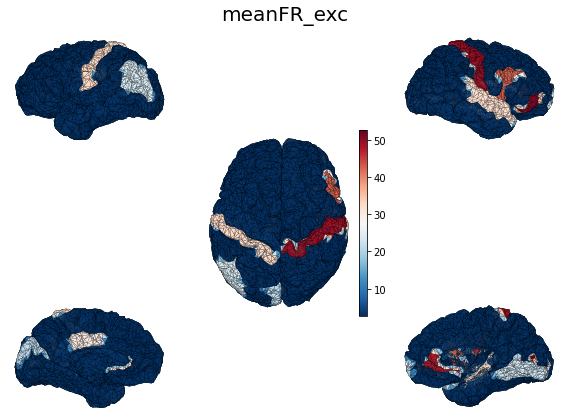

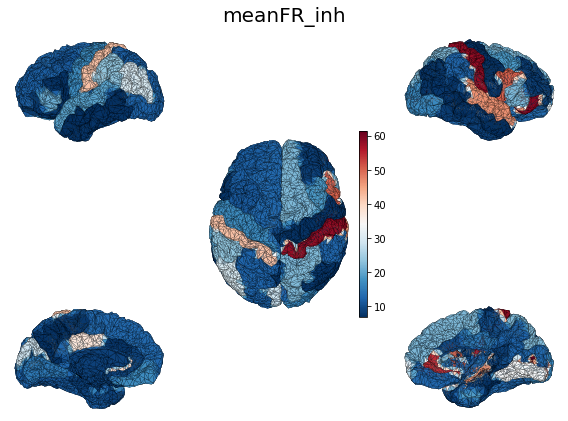

In [9]:
mean_t_FR_exc = np.mean(FR_exc, axis=0)
mean_t_FR_inh = np.mean(FR_inh, axis=0)
idx_regions = np.arange(68)
means = [mean_t_FR_exc, mean_t_FR_inh]
labels = ['meanFR_exc', 'meanFR_inh']

for ii, mean_array in enumerate(means):
    zlim = (np.amin(mean_array), np.amax(mean_array))
    fig = multiview_z_score(cortex, hem_left, hem_right, idx_regions, mean_array, 
                            zlim=zlim, title=labels[ii], figsize=(8, 8))
    fig.savefig(folder_figs + sim_name + labels[ii] + '_brainmap.png')
    plt.show()

# Correlations with a seed region that belongs to the DMN

/tmp/ipykernel_3111/3770542858.py:5: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


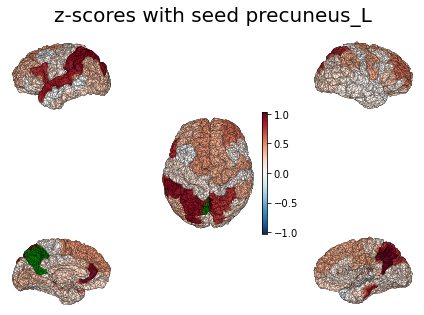

In [10]:
parameters = Parameter()
possible_seed = 50 #[50, 51, 20, 21]  # precuneus and posterior cingulate (seems large)
FC = np.corrcoef(FR_exc.T)
corrs_wrt_seed = FC[:, possible_seed]
z_value_wrt_seed = np.arctanh(corrs_wrt_seed)

# We want to ignore the values of the seed region
idx_regions_without_seed = np.concatenate((np.arange(0, possible_seed), np.arange(possible_seed+1, 68)))
zlim = np.amax(np.abs(z_value_wrt_seed[idx_regions_without_seed]))

fig = multiview_z_score(cortex, hem_left, hem_right, idx_regions_without_seed, 
                        z_value_wrt_seed, zlim=zlim, seed_region=possible_seed,
                        title=f'z-scores with seed {conn.region_labels[possible_seed]}',
                        figsize=(6, 6))
fig.savefig(folder_figs + sim_name + labels[ii] + 'zscores.png')
plt.tight_layout()
plt.show()

# Visualize stimulus dynamics

In [12]:
folder_root = '/media/master/Nuevo vol/Internship/Data/hpc_tvbadex/results_test_DMN/results_stims/'
# Define the parameters that we will use
cut_transient = 2000.0
run_sim = 5000.0

simulate = False  # if we want to simulate (True) or just plot (False)
stimval_max = 0.1 / 1000
stimvals = [stimval_max/3, stimval_max/2 , stimval_max]
stim_lens = [50, 500, 1000, 2000]  # in ms
stim_region = 5

lst = [stimvals, stim_lens]

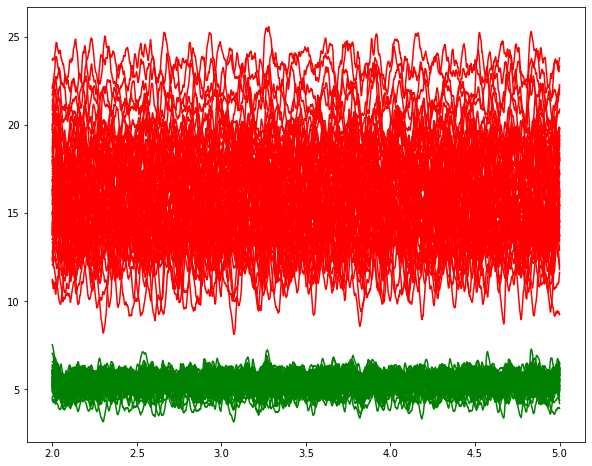

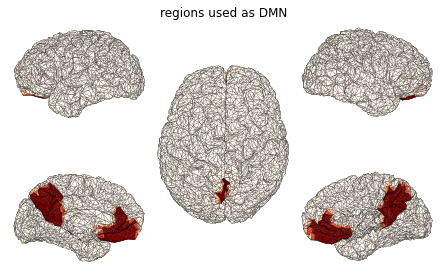

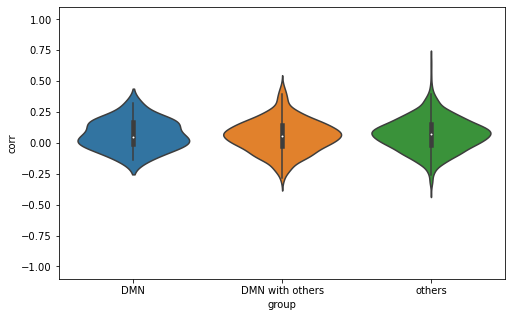

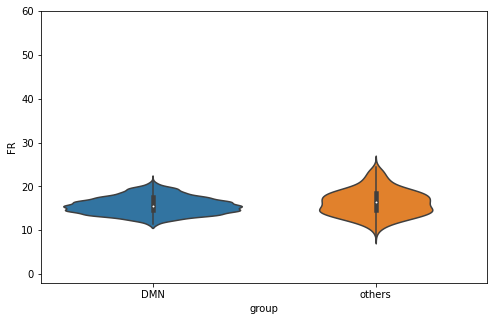

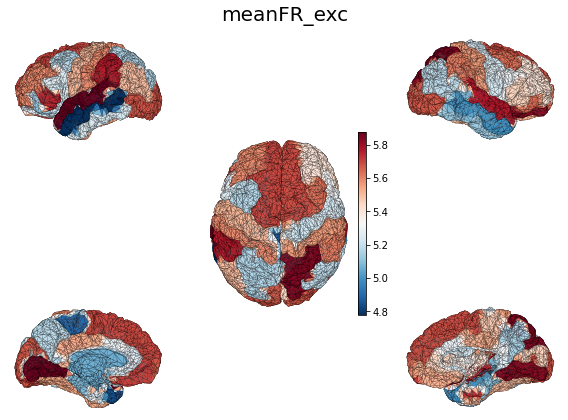

...

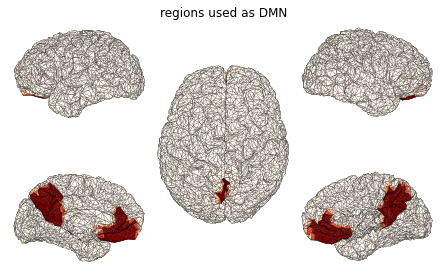

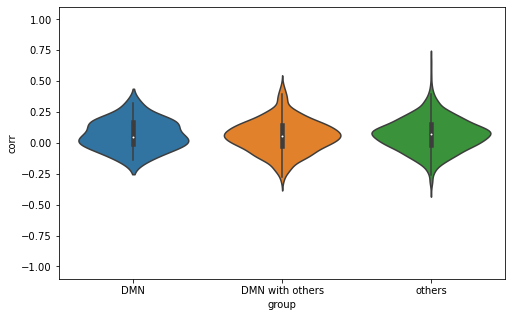

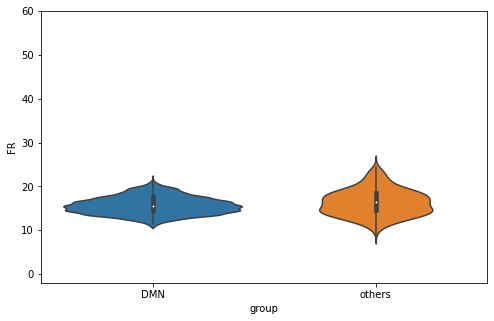

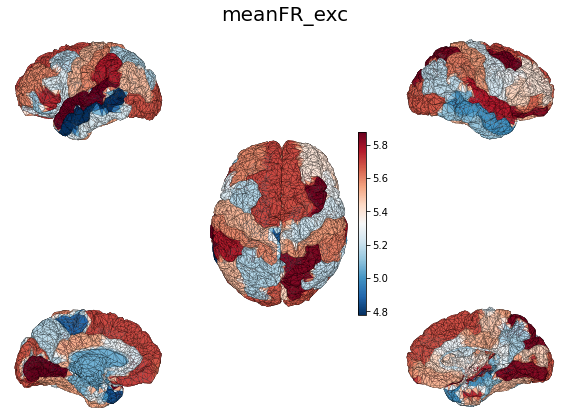

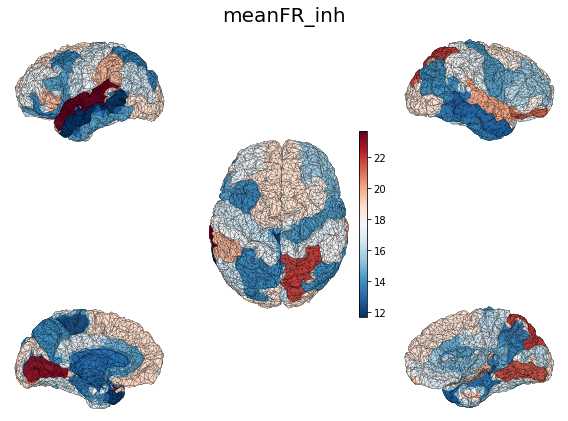

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


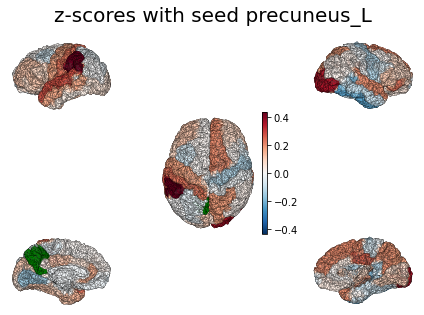

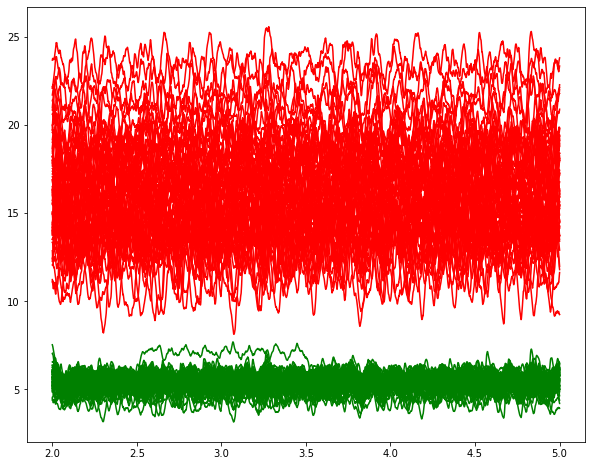

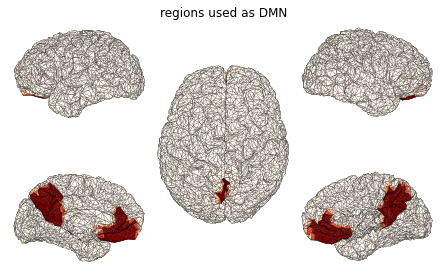

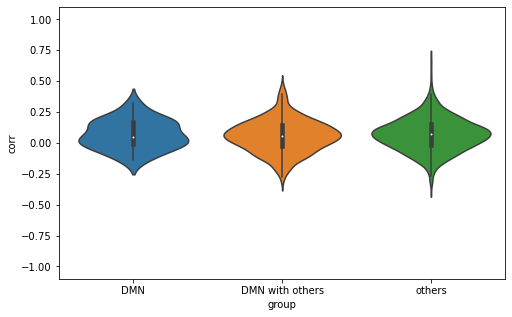

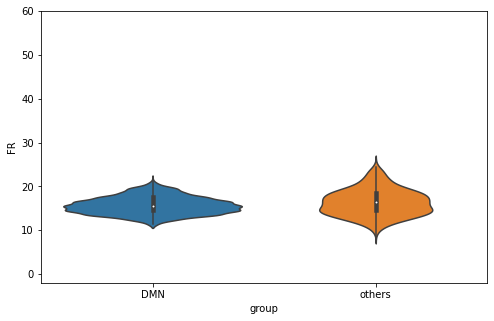

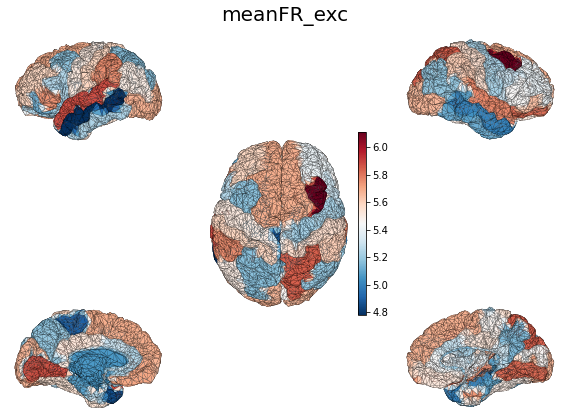

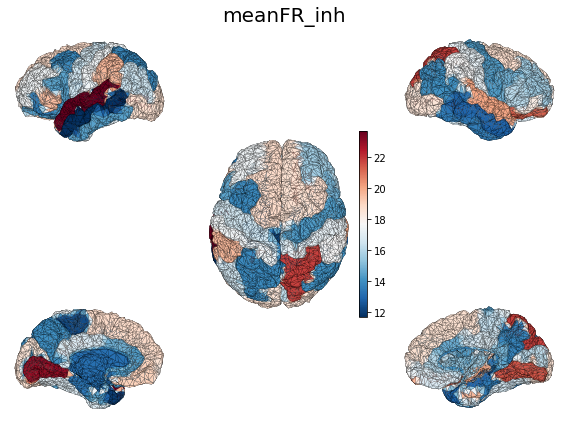

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


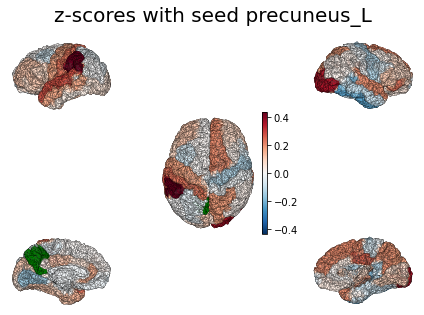

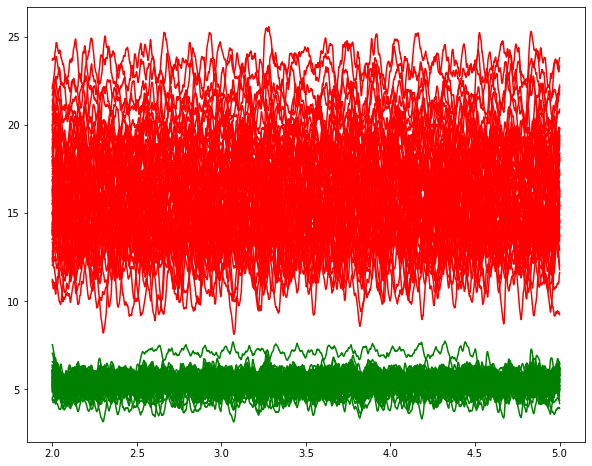

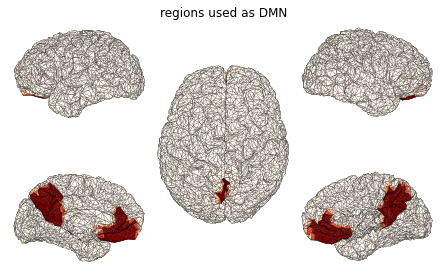

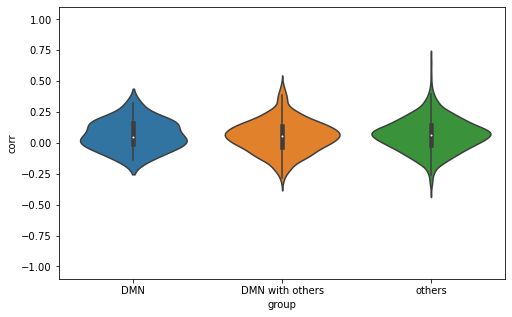

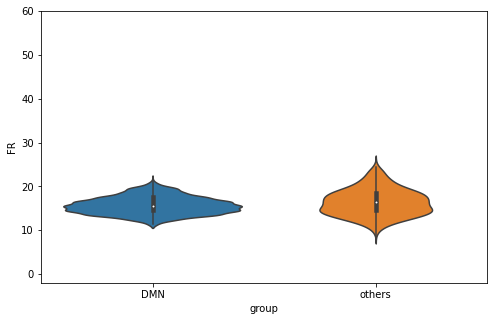

...

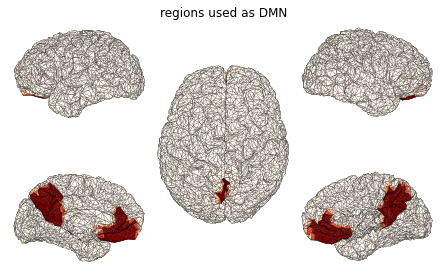

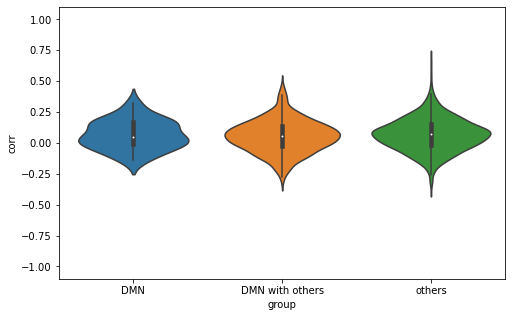

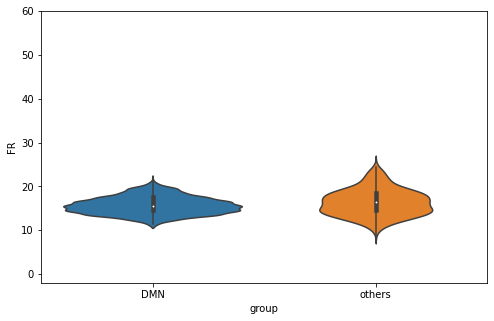

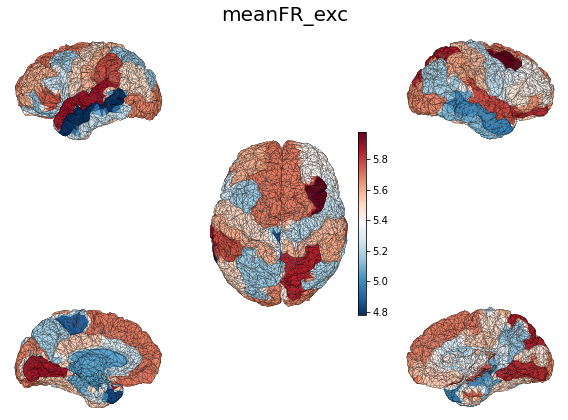

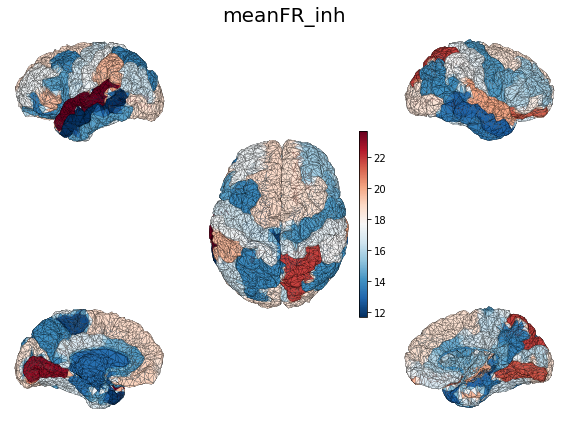

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


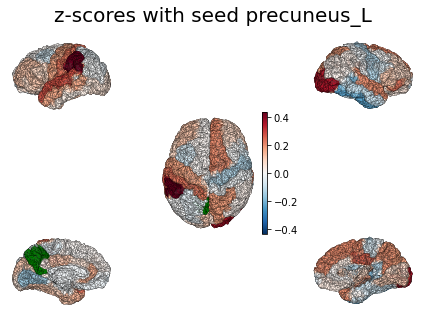

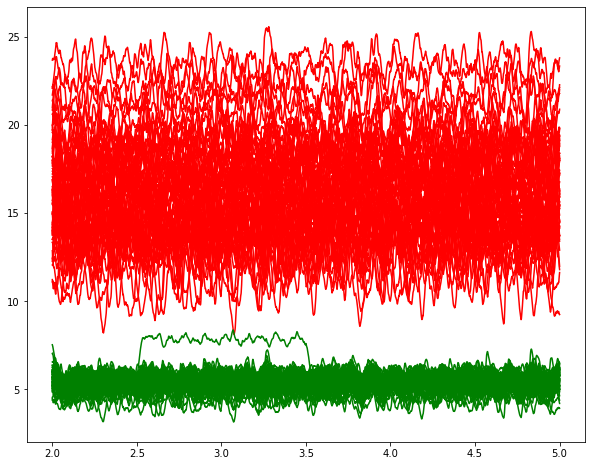

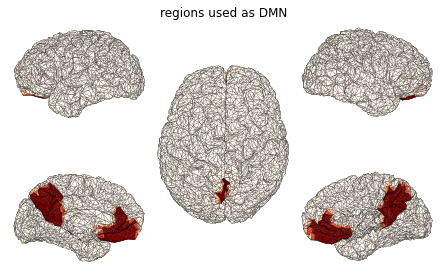

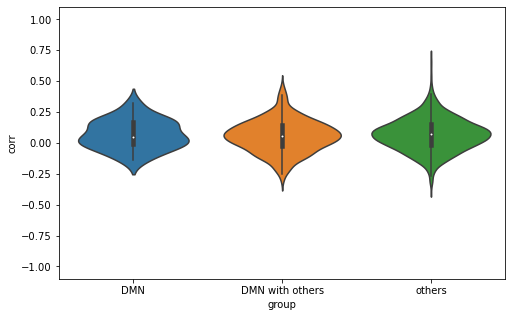

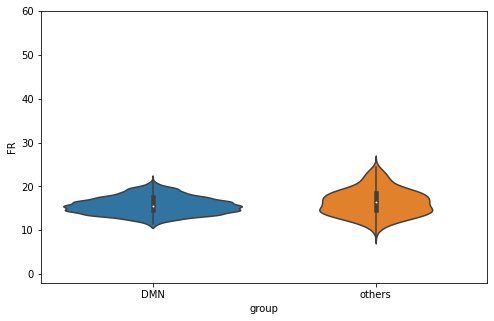

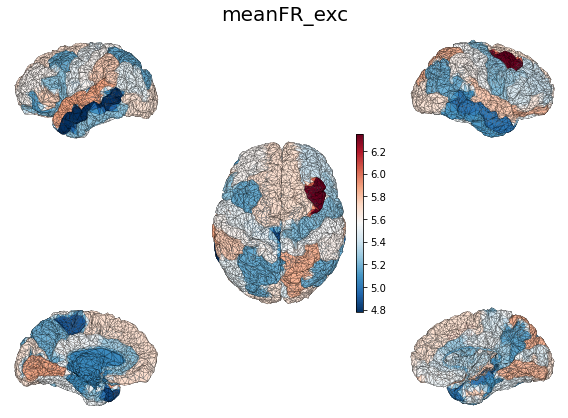

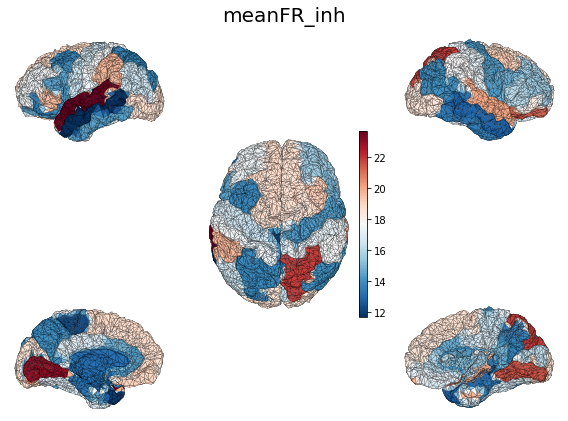

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


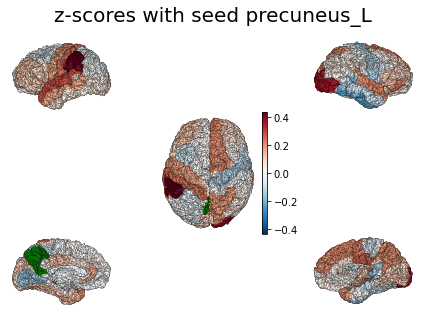

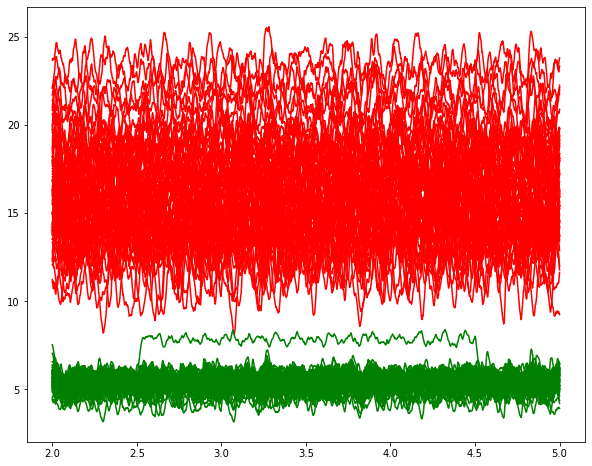

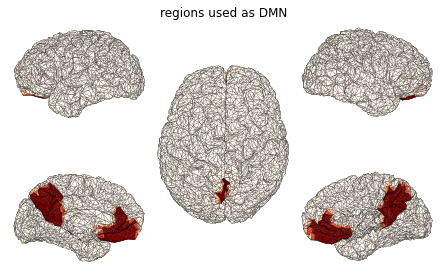

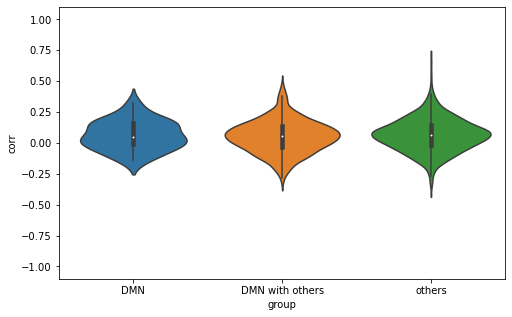

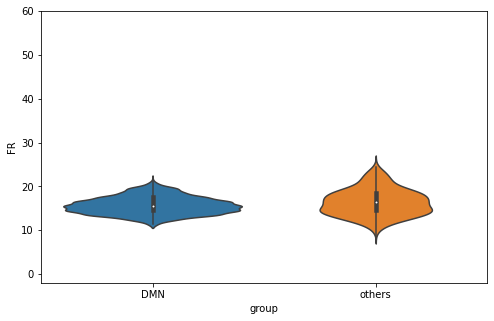

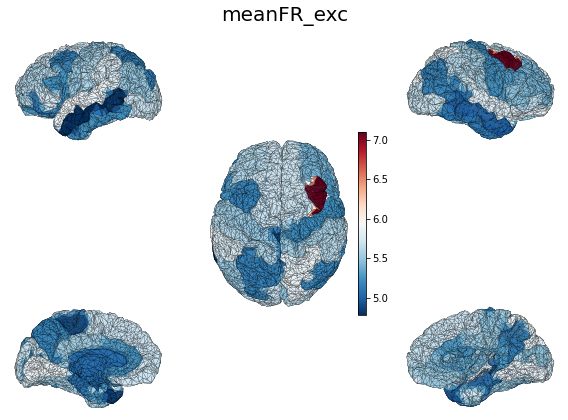

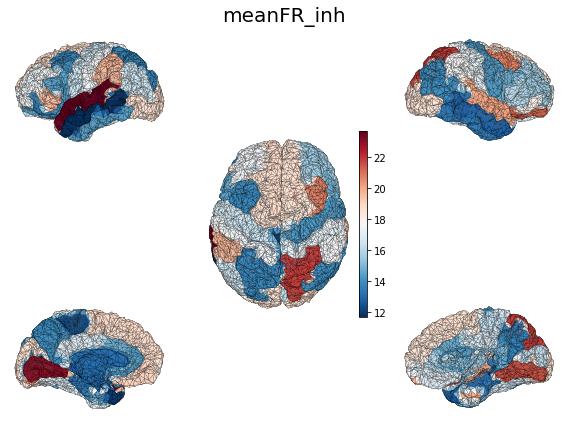

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


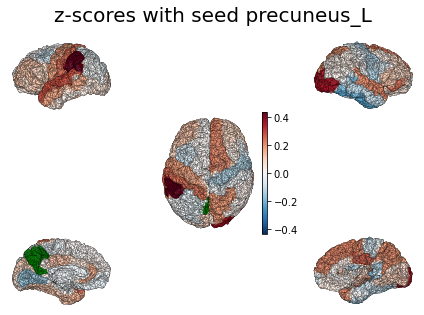

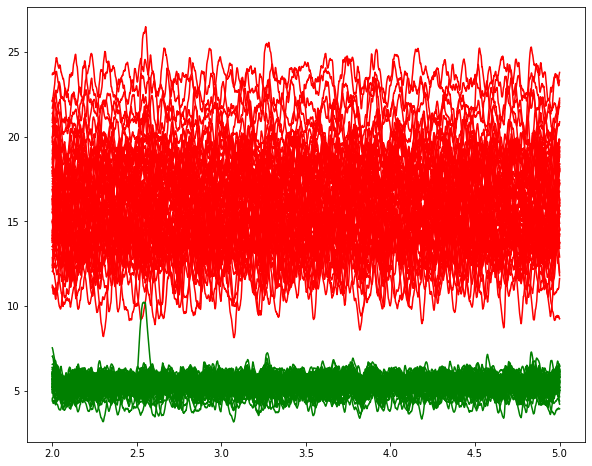

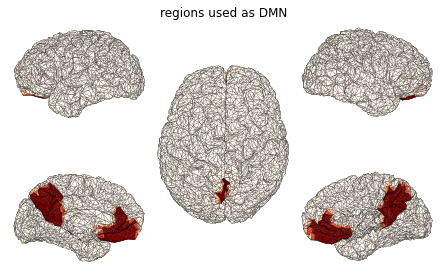

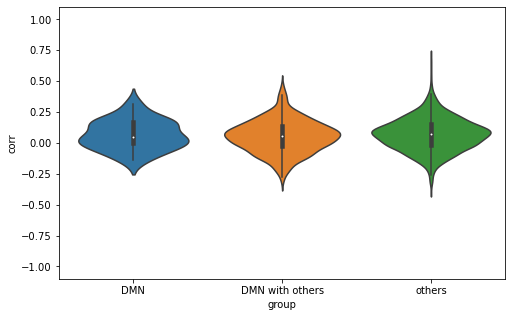

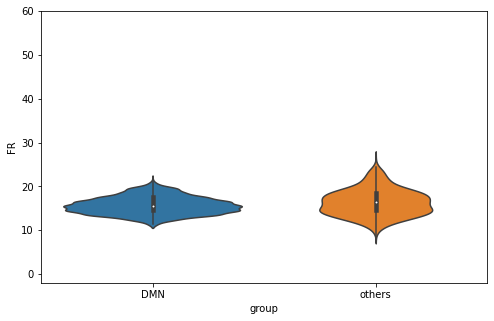

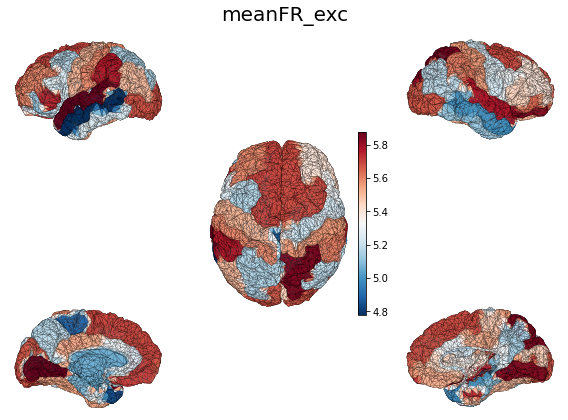

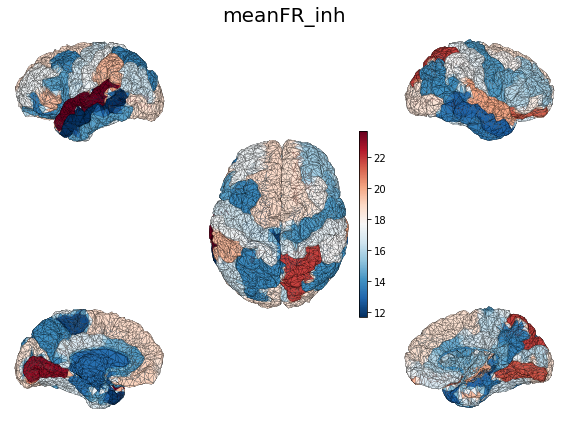

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


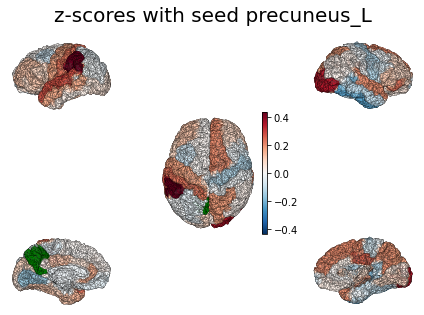

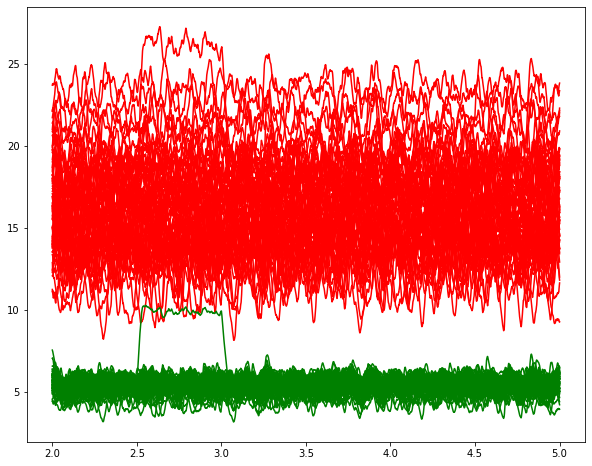

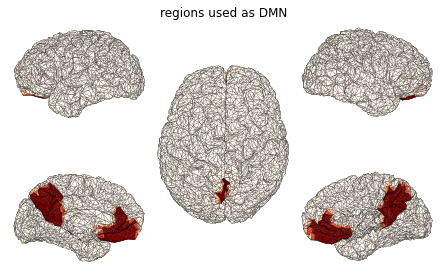

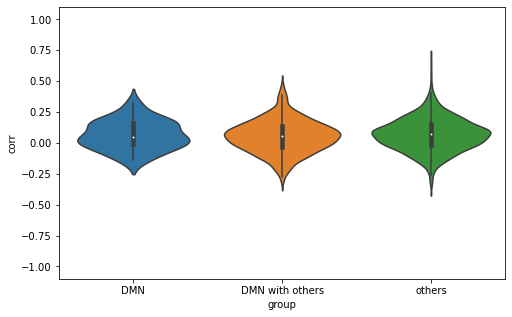

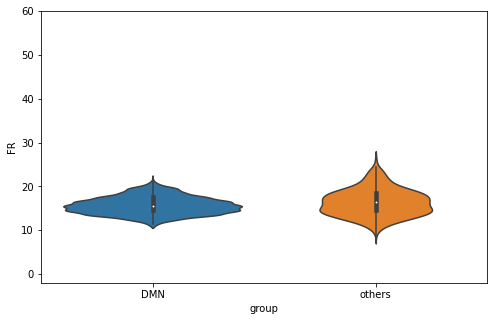

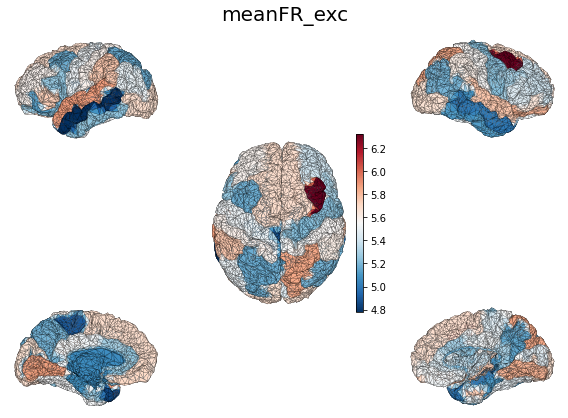

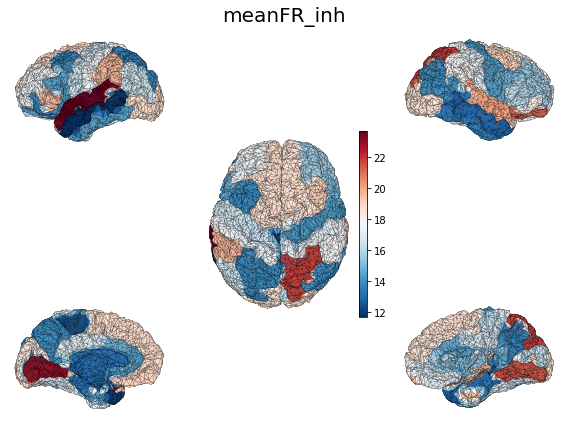

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


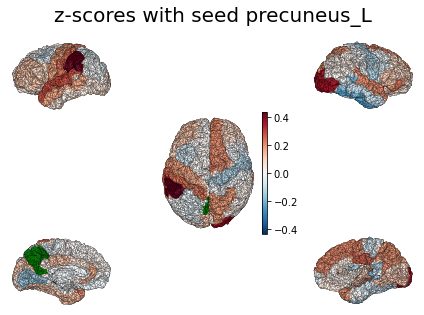

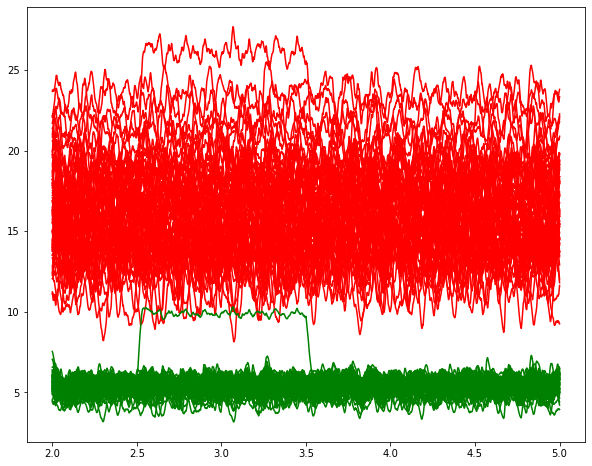

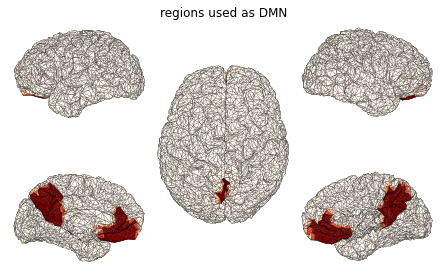

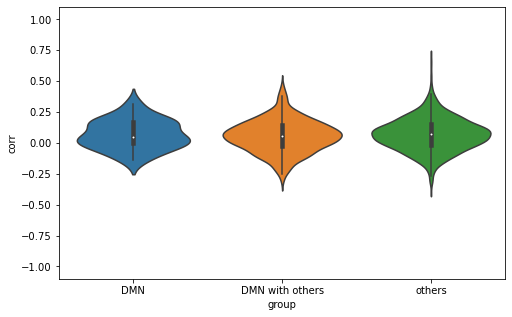

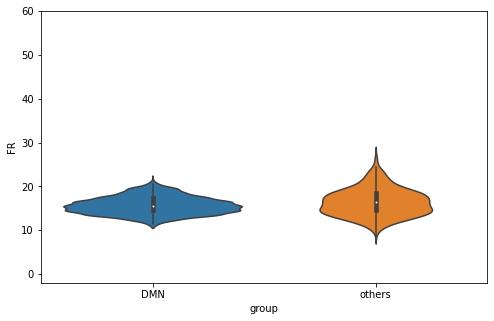

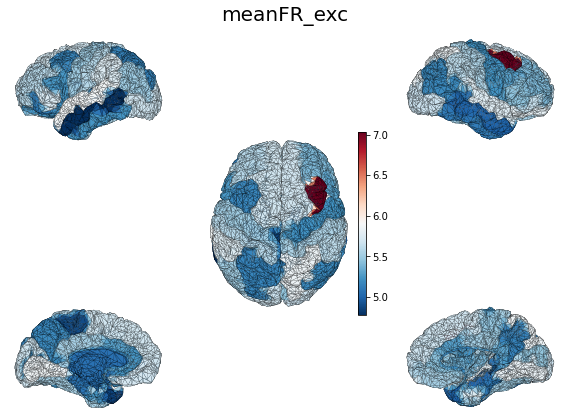

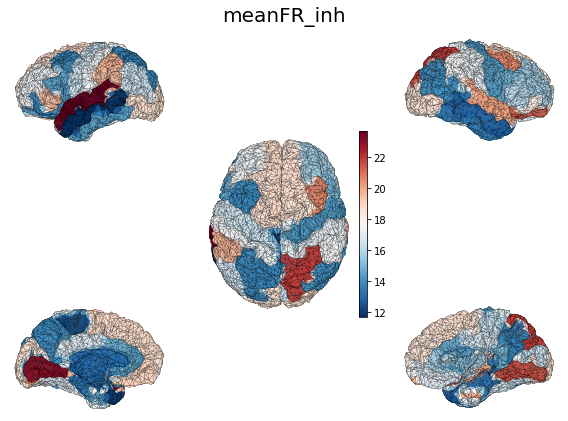

/tmp/ipykernel_16541/4048990780.py:113: RuntimeWarning: divide by zero encountered in arctanh
  z_value_wrt_seed = np.arctanh(corrs_wrt_seed)


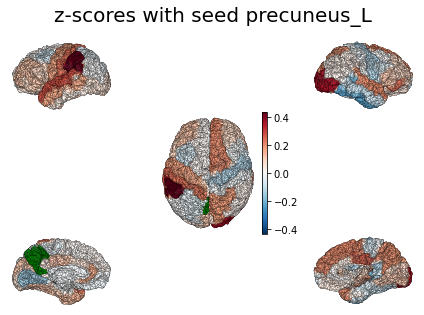

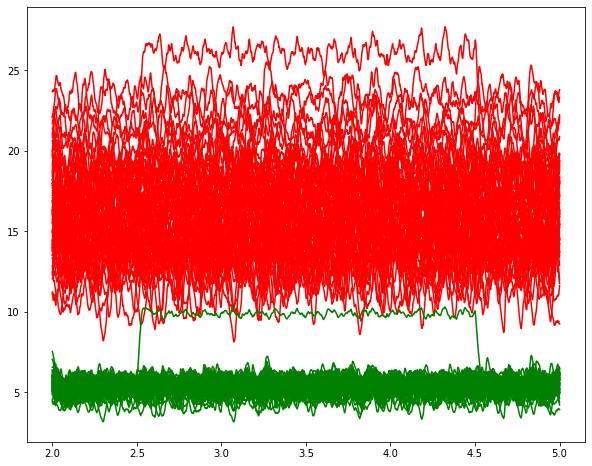

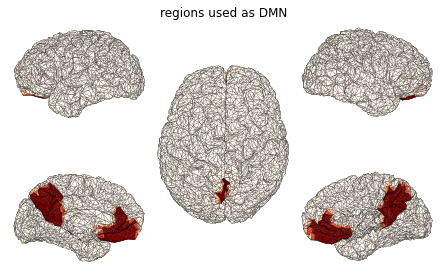

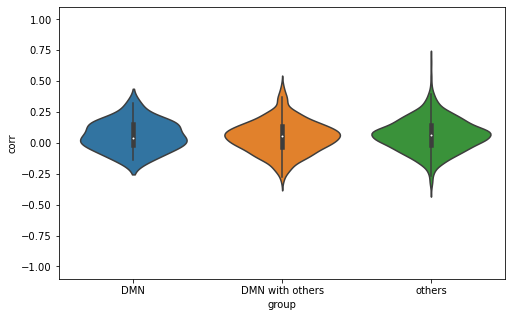

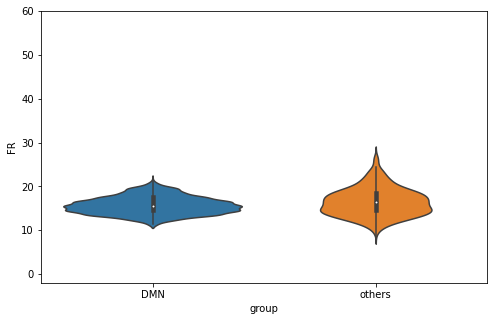

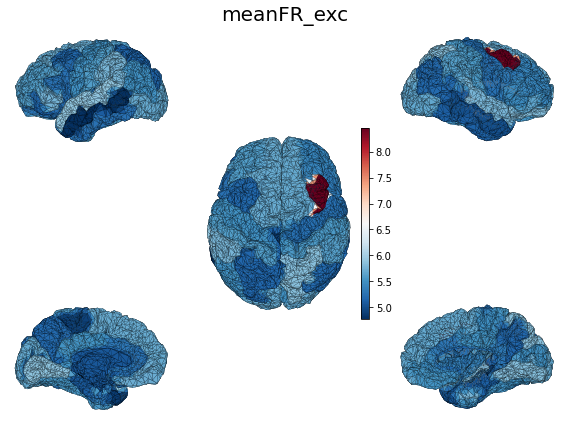

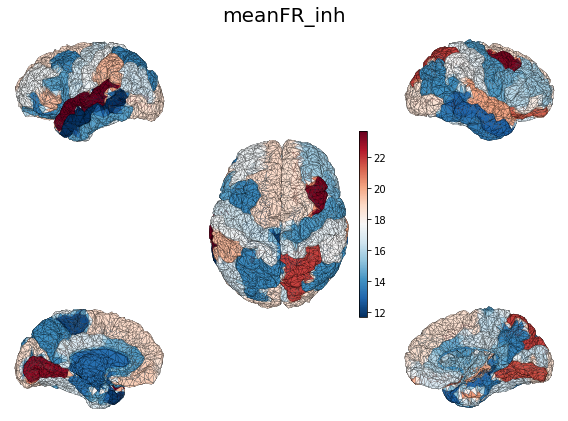

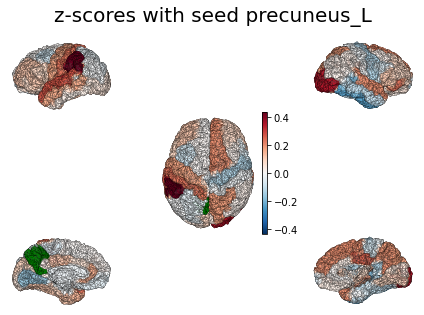

In [11]:
combinaison = list(itertools.product(*lst))

for simnum in range(len(combinaison)):
    
    parameters.parameter_model['b_e'] = 0.0
    stimval = combinaison[simnum][0]
    stimlen = combinaison[simnum][1]

    weights = list(np.zeros(68))
    weights[stim_region] = stimval  # 0.1 Hz if the model runs with kHz.

    parameters.parameter_stimulus['tau'] = stimlen  # Stimulus duration
    parameters.parameter_stimulus['T'] = 1e9  # Interstimulus interval
    parameters.parameter_stimulus['weights'] = weights
    parameters.parameter_stimulus['variables'] = [0]  # kick FR_exc
    parameters.parameter_stimulus['onset'] = 2500.0  # All stimuli start at 2.5s
    
    label_sim = '_stimval_' + str(stimval) + '_stimlen_' + str(stimlen) + '/'

    file_name = folder_root + label_sim
    parameters.parameter_simulation['path_result'] = file_name
    
    if simulate:
        # Set up simulator with new parameters
        simulator = tools.init(parameters.parameter_simulation, parameters.parameter_model,
                               parameters.parameter_connection_between_region,
                               parameters.parameter_coupling,
                               parameters.parameter_integrator,
                               parameters.parameter_monitor,
                               parameter_stimulation=parameters.parameter_stimulus)

        # Run simulations
        tools.run_simulation(simulator, run_sim, parameters.parameter_simulation, parameters.parameter_monitor)

    label_sim = '_stimval_' + str(stimval) + '_stimlen_' + str(stimlen) + '/'
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))


    file_name = folder_root + label_sim
    
    # Draw plots of the firing rates
    result = tools.get_result(file_name,cut_transient,run_sim)
    time_s = result[0][0]*1e-3 #from ms to sec
    FR_exc = result[0][1][:,0,:]*1e3 # from KHz to Hz; Excitatory firing rate
    FR_inh = result[0][1][:,1,:]*1e3 # from KHz to Hz; Inhibitory firing rate
    time_s = np.array(time_s, dtype=float)
    del result

    ax.plot(time_s, FR_inh, label=r'$v_i$', c='r')
    ax.plot(time_s, FR_exc, label=r'$v_e$', c='g')
    plt.show()
    sim_name = label_sim[:-1]

    folder_figs = './figures/' + sim_name + '/'

    try:
        os.listdir(folder_figs)
    except:
        os.mkdir(folder_figs)
    
    # We can obtain all the previously shown figures
    # cortex initialization
    cortex, conn, hem_left, hem_right = prepare_surface_regions_human(parameters, 
                                                                      conn_filename='Connectivity.zip',
                                                                      zip_filename='Surface_Cortex.zip',
                                                                      region_map_filename='RegionMapping.txt')
    the_data = np.zeros((cortex.region_mapping_data.array_data.shape[0],))
    DMN_regions = [28, 29, 52, 53,  # mPFC
              50, 51, 20, 21]   # precuneus and posterior cingulate (seems large)
    # DMN regions plot
    title = 'regions used as DMN'
    multiview_one(cortex, hem_left, hem_right, 
                  DMN_regions, the_data, plt.figure(), suptitle='', 
                  title=title, figsize=(8, 8), shaded=False)
    fig.savefig(folder_figs + sim_name + 'DMN_regions.png')
    # violin plot with correlation in/out DMN
    fig, ax = plot_corr_dmn(corr_dmn(FR_exc), type_plot='violin', jitter=False)
    fig.savefig(folder_figs + sim_name + 'corr_DMN_others.png')
    plt.show()
    # violin plot with histograms of FR in/out DMN
    hist_DMN, hist_others, bins_edges = hist_FR_dmn(FR_inh)
    fig, ax = plot_violin_hist_FR(hist_DMN, hist_others, bins_edges, jitter=False, bw_violin=0.25)
    fig.savefig(folder_figs + sim_name + 'histFR_DMN_others.png')
    # Mean Firing rate colored on whole brain
    mean_t_FR_exc = np.mean(FR_exc, axis=0)
    mean_t_FR_inh = np.mean(FR_inh, axis=0)
    idx_regions = np.arange(68)
    means = [mean_t_FR_exc, mean_t_FR_inh]
    labels = ['meanFR_exc', 'meanFR_inh']
    for ii, mean_array in enumerate(means):
        zlim = (np.amin(mean_array), np.amax(mean_array))
        fig = multiview_z_score(cortex, hem_left, hem_right, idx_regions, mean_array, 
                                zlim=zlim, title=labels[ii], figsize=(8, 8))
        fig.savefig(folder_figs + sim_name + labels[ii] + '_brainmap.png')
        plt.show()
    # zscores wrt to a seed colored on whole brain    
    possible_seed = 50  # precuneus and posterior cingulate (seems large)
    FC = np.corrcoef(FR_exc.T)
    corrs_wrt_seed = FC[:, possible_seed]
    z_value_wrt_seed = np.arctanh(corrs_wrt_seed)
    idx_regions_without_seed = np.concatenate((np.arange(0, possible_seed), np.arange(possible_seed+1, 68)))
    zlim = np.amax(np.abs(z_value_wrt_seed[idx_regions_without_seed]))
    fig = multiview_z_score(cortex, hem_left, hem_right, idx_regions_without_seed, 
                            z_value_wrt_seed, zlim=zlim, seed_region=possible_seed,
                            title=f'z-scores with seed {conn.region_labels[possible_seed]}',
                            figsize=(6, 6))
    fig.savefig(folder_figs + sim_name + labels[ii] + 'zscores.png')
    plt.tight_layout()
    plt.show()

# Seeing how the FC changes from before to after stimuli

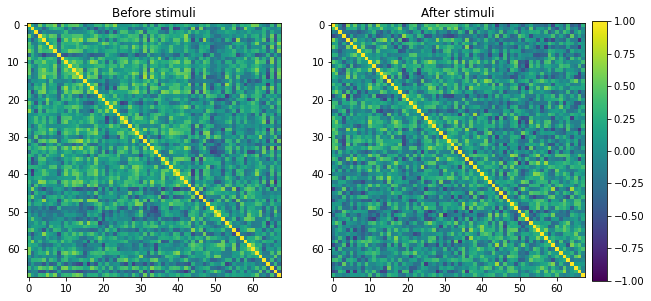

1309.13715573286
424.1092679379608
198.6097901869172


In [13]:
# First of all, we are interested in structural changes in the matrix. At first view it seems quite clear that the
# shape changes, it becomes more difused. However, is this due to the fact that the time windows are different?
# Same time window we obtain equally smooth plots but we can see that they change nonetheless. 
label_sim = '_stimval_' + str(stimvals[-1]) + '_stimlen_' + str(stim_lens[-1]) + '/'
file_name = folder_root + label_sim
result = tools.get_result(file_name,cut_transient,run_sim)
time_s = result[0][0]*1e-3 #from ms to sec
FR_exc = result[0][1][:,0,:]*1e3 # from KHz to Hz; Excitatory firing rate
FR_inh = result[0][1][:,1,:]*1e3 # from KHz to Hz; Inhibitory firing rate
time_s = np.array(time_s, dtype=float)
del result
time_stimuli = 2500.0
L = idx_in_stim = int((time_stimuli - cut_transient)/parameters.parameter_integrator['dt'])
FR = FR_exc
FC_before = np.corrcoef(FR[:idx_in_stim, :].T)
FC_after = np.corrcoef(FR[idx_in_stim : idx_in_stim + L, :].T)

fig, axes = plt.subplots(1, 2, figsize=(10, 6))
axes[0].imshow(FC_before, vmin=-1, vmax=1)
axes[0].set(title='Before stimuli')

im = axes[1].imshow(FC_after, vmin=-1, vmax=1)
axes[1].set(title='After stimuli')
cb_ax = fig.add_axes([.91,.2,.02,.6])
fig.colorbar(im,orientation='vertical',cax=cb_ax)

plt.show()

print(np.sum(np.abs(FC_before - FC_after)))
print(np.sum(FC_before))
print(np.sum(FC_after))

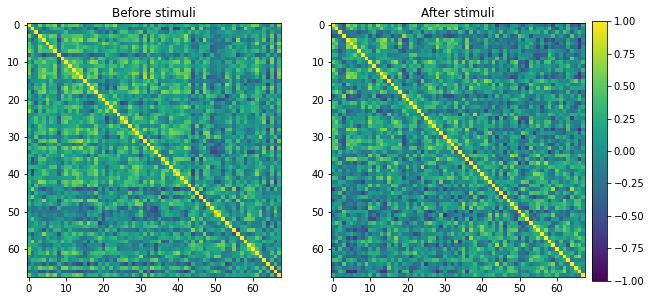

1342.3467206245589
467.4840264703295
182.41554061512775


In [14]:
# Compare with case without stimuli but with same windows of correlation. See if correlations change significantly 
# in time
folder_root = '/media/master/Nuevo vol/Internship/Data/hpc_tvbadex/results_test_DMN/results_seeds/'
label_sim = '_b_0_s_20/'
file_name = folder_root + label_sim
result = tools.get_result(file_name,cut_transient,run_sim)
time_s = result[0][0]*1e-3 #from ms to sec
FR_exc = result[0][1][:,0,:]*1e3 # from KHz to Hz; Excitatory firing rate
FR_inh = result[0][1][:,1,:]*1e3 # from KHz to Hz; Inhibitory firing rate
time_s = np.array(time_s, dtype=float)
del result
time_stimuli = 2500.0
L = idx_in_stim = int((time_stimuli - cut_transient)/parameters.parameter_integrator['dt'])
FR = FR_exc
FC_before = np.corrcoef(FR[:idx_in_stim, :].T)
FC_after = np.corrcoef(FR[idx_in_stim : idx_in_stim + L, :].T)

fig, axes = plt.subplots(1, 2, figsize=(10, 6))
axes[0].imshow(FC_before, vmin=-1, vmax=1)
axes[0].set(title='Before stimuli')

im = axes[1].imshow(FC_after, vmin=-1, vmax=1)
axes[1].set(title='After stimuli')
cb_ax = fig.add_axes([.91,.2,.02,.6])
fig.colorbar(im,orientation='vertical',cax=cb_ax)

plt.show()

print(np.sum(np.abs(FC_before - FC_after)))
print(np.sum(FC_before))
print(np.sum(FC_after))

So we can see that there seems to also be significant changes in FC when taking different windows, even without stimuli. So we will have to compare the stimuli results with these ones evidently. Ideally we can simulate longer times or try to center the stimulus at 4s and then simulate from 2 to 6, to be able to compare time windows.
Maybe ask Alain about interest in studying transient characteristics of the Functional Connectivity.

**It could also be interesting to obtain changes in FC as a function of window for correlation**

# Are the changes significant?

Printing the sum seems to indicate that when stimulating the whole system decorrelates. Interesting. See which nodes decorrelate the most (an interesting prediction would be the DMN). However this reflects the statistics, as TA said, we are interested in a change of structure.

Will compute two different things today:
- First: **Compute how much each pair changes from before to after stimulus --> See if the change is significant value away from zero by using a two tailed test --> Count number of pairs away from significant value**. Compare with the different stimulation lengths and see which combinations are best. **To do this one we need many different simulations to compute the significant results**.
- Second: Continuing with the study of the DMN. **Again a violin plot, however, this time plotting the differences in correlation from before to after. Additionally maybe plot whole brain map colored and compare to DMN**

## First study on stimuli
We will be doing significant tests, so let me try to make this thorough.

We want to see if stimulation has a significant change in functional connectivity between each pair of nodes. Then we will see, for each stimulation length, the amount of pairs where the change is significant to determine if the length is enough or not.

I will explain the process for one stimulation length and then it will be generalized for the other values.

So, first it would be ideal to store an array (68, 68, 40) of the FC_before - FC_after containing the 40 seeds.

That way we won't have to load all the values all the time, instead we will have only a few .npy files to load. We will also save the same file but obtaining the FC_before - FC_after of a non_stimulated simulation to use for the null hypothesis.

In [21]:
run = False  # Change to true to run the cell
steps = 40
seeds = [i for i in range(20, 20+steps)]

#diffs = np.zeros((diff_FC_b_a.shape[0], diff_FC_b_a.shape[1], steps))  # We will not fill it completely
stimlens = [50, 500, 1000, 2000]
run_sim = 7000.0
cut_transient = 2000.0
dt = parameters.parameter_integrator['dt']
folder_save_npys = './stims_seeds_significance/'

if run:
    before_after_spon = np.zeros((68, 68, steps))  # Only need one
    for stimlen in stimlens:
        before_after_stim = np.zeros_like(before_after_spon)
        for s, seed in enumerate(seeds):
            # Stimulated case
            folder_root = '/media/master/Nuevo vol/Internship/Data/hpc_tvbadex/results_test_DMN/results_stims/'
            label_sim = '_seed_' + str(seed) + '_stimlen_' + str(stimlen) + '/'
            file_name = folder_root + label_sim  # folder with results

            result = tools.get_result(file_name,cut_transient,run_sim) # load results
            FR = result[0][1][:,0,:]*1e3  # We only make use of excitatory FR


            time_stimuli = np.load(file_name + 'onset_time.npy')  # Load the time at which the stimuli is applied

            # Obtain the index of the FR arrays at which the time is applied. 
            idx_in_stim = int((time_stimuli - cut_transient)/dt)
            L = int(1000 / dt)  # 1000ms. Length of the window used to obtain the correlations

            FC_before = np.corrcoef(FR[idx_in_stim - L: idx_in_stim, :].T)
            FC_after = np.corrcoef(FR[idx_in_stim : idx_in_stim + L, :].T)

            before_after_stim[:, :, s] = FC_before - FC_after

            # NON-Stimulated case, only need one
            if stimlen == stimlens[0]:
                folder_root = '/media/master/Nuevo vol/Internship/Data/hpc_tvbadex/results_test_DMN/results_seeds/'
                label_sim = '_b_0_s_' + str(seed) + '/'
                file_name = folder_root + label_sim  # folder with results

                result = tools.get_result(file_name,cut_transient,run_sim) # load results
                FR = result[0][1][:,0,:]*1e3  # We only make use of excitatory FR

                FC_before = np.corrcoef(FR[idx_in_stim - L: idx_in_stim, :].T)
                FC_after = np.corrcoef(FR[idx_in_stim : idx_in_stim + L, :].T)

                before_after_spon[:, :, s] = FC_before - FC_after

        np.save(folder_save_npys + f'len_{stimlen}_stim.npy', before_after_stim)

    np.save(folder_save_npys + 'spon.npy', before_after_spon)

Now that we have simplified the data with which we will work we can start to see how to perform the statistics.

The null hypothesis will be that the stimulation has no effect on the change in FC obtained from two times. For that reason, we will make use of the spontaneous FC data as the data for the null hypothesis.

We can easily obtain the mean change for each pair by doing the mean of the spontaneous array along the 40 seeds.

The mean and standard deviations of the stimulated array can be obtained using the same process.

Then, for each pair, we will obtain the tscore, trying to see if the difference in FC is significantly far away from 0. We will do this by calculating the t-score.

We will thus obtain a (68, 68) t-score. There we will obtain the p-values and compare them with the statistical significance that we will first set to 0.05. We will count how many p values are smaller than statistical significance for each length.

From there analyze the results.

0.02370500438981563
0.031167690956979806
0.030728709394205442
0.030728709394205442


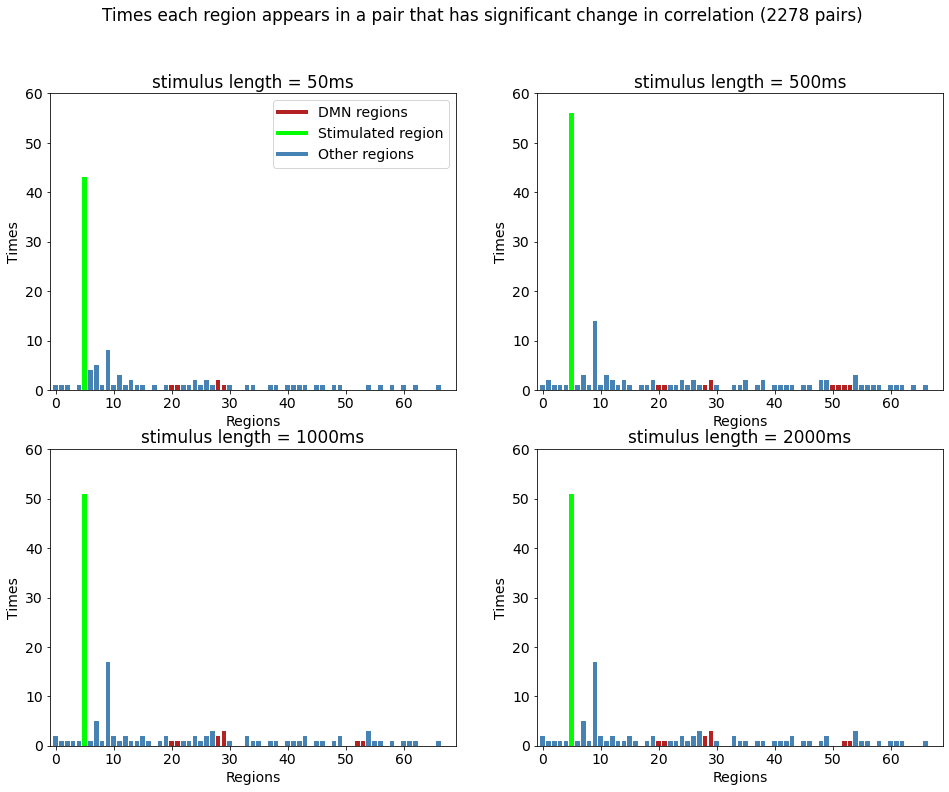

In [70]:
# Pepare variables and plots
plt.rcParams.update({'font.size': 14})
before_after_spon = np.load(folder_save_npys + 'spon.npy')
means_H0 = np.mean(before_after_spon, axis=2)
alpha = 0.05

regions = np.arange(68)

colors = []
for region in regions:
    if region in DMN_regions:
        colors.append('firebrick')
    elif region == stim_region:
        colors.append('lime')
    else:
        colors.append('steelblue')
DMN_regions = [28, 29, 52, 53,  # mPFC
               50, 51, 20, 21]   # precuneus and posterior cingulate (seems large)                

custom_lines = [plt.Line2D([0], [0], color='firebrick', lw=4),
                plt.Line2D([0], [0], color='lime', lw=4),
                plt.Line2D([0], [0], color='steelblue', lw=4)]
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for ii, stimlen in enumerate(stimlens):
    before_after_stim = np.load(folder_save_npys + f'len_{stimlen}_stim.npy')
    means_sample = np.mean(before_after_stim, axis=2)
    std_sample = np.std(before_after_stim, axis=2)
    
    tscore = (means_sample - means_H0) / (std_sample / np.sqrt(len(seeds)))
    
    pval = stats.t.sf(np.abs(tscore), steps-1)*2  # two-sided pvalue = Prob(abs(t)>tt)    
    counts_regions = np.zeros_like(regions)
    count_significant = 0
    total_count = 0
    for i in range(pval.shape[0]):
        for j in range(i):
            total_count += 1
            if pval[i, j] < alpha:
                #print(i, j)
                count_significant += 1
                counts_regions[i] += 1
                counts_regions[j] += 1
    print(count_significant/total_count)
    ax = axes[ii]            
    ax.bar(regions, counts_regions, color=colors, width=0.8)
    ax.set(xlim=(-1, 69), ylim=(0, 60), ylabel='Times', xlabel='Regions')
    ax.set_title(f'stimulus length = {stimlen}ms')
axes[0].legend(custom_lines, ['DMN regions', 'Stimulated region', 'Other regions'])
fig.suptitle(f'Times each region appears in a pair that has significant change in correlation ({total_count} pairs)')
plt.show()

In [ ]:
# Do a barplot with the bars of the DMN nodes being different color than the others
# Very little significance
# Start to think about why we can't find anything related to the DMN

So we can see that the amount of nodes that have significant change in FC are not many. Only around 3% of the pairs see a significant change in their functional connectivity. If we print which of those pairs are the ones that change the most, we can see that most pairs 

My first idea would be to test the ratio of significant changes for each group. We would expect the DMN to decorrelate, right? Or to deactivate, I always have that problem. Maybe the statistics can give us some hints.

I think it would be worthwhile to go back to the papers with the knowledge of statistical tests and everything and maybe try to understand those better. I think it might also be interesting to continue with the parameter sweep

## Second study

In [69]:
# In this second study I will try to do another violin plot showing the differences in correlation between the
# nodes in the DMN and the ones that are not in the DMN. I guess I could take one seed as well and use it to obtain
# correlations and then compare which correlations changed the most. We would expect a decrease in correlation in 
# the regions belonging to the DMN while the others should stay more or less equal. Like that we can also see 
# how the stimulated region correlates to the seed.

# Start by plotting the three

# We slightly modify the analyses function
def diff_corr_dmn(fr, time_stimuli = 2500.0, dt=0.1, dmn_regions=None, wind_for_corr=None):
    """ Returns a data frame containing the statistics of the correlation values between pairs of nodes:
    - Correlations between nodes of the Default Mode Network (DMN)
    - Correlations between nodes of the DMN and other nodes
    - Correlations between nodes not of the DMN

    The last one being, usually, the largest group of the three.

    Parameters
    ----------
    fr: ndarray
        Numpy array of shape (N, M) containing the firing rates of M regions.
        
    time_stimuli: float
        Time at which the stimulus has been applied to the stimulated region.
            
    dmn_regions: list
        Contains the indexes of the M regions that belong to the Default Mode Network.
    
    wind_for_corr: float
        In ms, window of time used to compute the correlations. FC before stimuli will be obtained with 
        time steps of L ms immediately previous to stimuli and FC after with L ms immediately after stimulus
        application.


    Returns
    -------
    data: pandas.DataFrame
        Contains M(M-1) rows with the values of correlation and to which group each value belongs.
    """

    if dmn_regions is None:
        dmn_regions = [28, 29, 52, 53,  # mPFC
                       50, 51, 20, 21]  # precuneus / posterior cingulate
    corrs_in_DMN = []
    corrs_out_DMN = []
    corrs_in_out_DMN = []

    # idx of the fr at which the stimulus is applied
    idx_in_stim = int((time_stimuli - cut_transient) / dt)
    if wind_for_corr is None:
        L = idx_in_stim
    else:
        L = int(wind_for_corr / dt)
    N, M = fr.shape
    FC_before = np.corrcoef(fr[idx_in_stim - L: idx_in_stim, :].T)
    FC_after = np.corrcoef(fr[idx_in_stim: idx_in_stim + L, :].T)
    
    FC_diff_b_a = FC_before - FC_after
    for i in range(M):
        for j in range(i): # If we want to take only one triangular portion of the matrix.
        #for j in range(M):
            if i == j:  # Not interested in diagonal
                continue
            corr = FC_diff_b_a[i, j]
            if i in dmn_regions and j in dmn_regions:
                corrs_in_DMN.append(corr)
            elif any(n in dmn_regions for n in (i, j)):
                corrs_in_out_DMN.append(corr)
            else:
                corrs_out_DMN.append(corr)

    # Saving results in a dataframe
    df_in_DMN = pd.DataFrame({'group': np.repeat('DMN', len(corrs_in_DMN)),
                              'corr': corrs_in_DMN})

    df_in_out_DMN = pd.DataFrame({'group': np.repeat('DMN with others', len(corrs_in_out_DMN)),
                                  'corr': corrs_in_out_DMN})

    df_out_DMN = pd.DataFrame({'group': np.repeat('others', len(corrs_out_DMN)),
                               'corr': corrs_out_DMN})

    data = pd.concat([df_in_DMN, df_in_out_DMN, df_out_DMN])

    return data

def plot_diff_corr_dmn(df_corrs_dmn, type_plot='violin', jitter=False):
    """ Shows box or violin plot of the statistics of correlation between nodes in the TVB.
    Separates in three groups:
    - Correlations between nodes of the Default Mode Network (DMN)
    - Correlations between nodes of the DMN and other nodes
    - Correlations between nodes not of the DMN

    The last one being, usually, the largest group of the three.

    Parameters
    ----------
    df_corrs_dmn: pandas.DataFrame
        Containing M rows. Each row will have a correlation value and the label of the cathegory of the value.

    type_plot: str
        Either 'box' or 'violin'.

    jitter: bool
        Determines whether we want to plot all the data points.

    Returns
    -------
    fig: matplotlib.pyplot fig object
    ax: matplotlib.pyplot axes object
        Shows statistics of correlations between the different nodes in the network.
    """
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    ax.set(ylim=(-2, 2))
    if type_plot == 'box':
        sns.boxplot(x='group', y='corr', data=df_corrs_dmn, ax=ax)

    elif type_plot == 'violin':
        sns.violinplot(x='group', y='corr', data=df_corrs_dmn, ax=ax)
    else:
        raise ValueError('Incorrect choice of type_plot (either box or violin)')

    if jitter:
        sns.stripplot(x='group', y='corr', data=df_corrs_dmn, color="orange", jitter=0.2, size=2, ax=ax)

    return fig, ax

(<Figure size 576x360 with 1 Axes>,
 <AxesSubplot:xlabel='group', ylabel='corr'>)

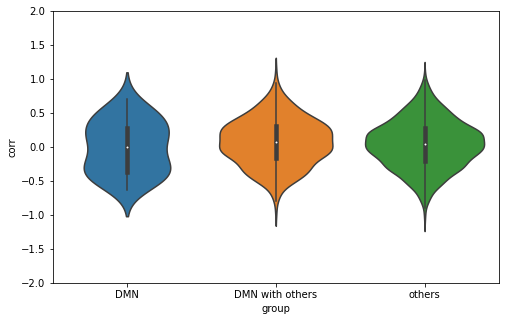

In [70]:
plot_diff_corr_dmn(diff_corr_dmn(FR_exc), type_plot='violin')

Again, not exactly what I was expecting :(. I hope tomorrow I will be a bit fresher and can give some insight into that. I don't think that taking the absolute value will help either. I am also thinking that for this case the seeding approach might also be interesting.

DMN is a bimodal while the other two seem like a normal. Takign the absolute value seems to change but we are not interested in the absolute value in this case here.